In [1]:
import matplotlib.pyplot as plt
plt.style.use('../mystyle.mplstyle')

buttons=["search", "pageLength","copyHtml5", "csvHtml5", "excelHtml5"]

`````{admonition} Remark
:class: important

Please be aware that these lecture notes are accessible online in an '**early access**' format. They are actively being developed, and certain sections will be further enriched to provide a comprehensive understanding of the subject matter.

`````

(_vector_data)=
# Vector Data Models

Vector data is a fundamental method of representing real-world features in spatial analysis and geographic information systems (GIS). It uses geometric shapes to depict geographical elements with high precision and efficiency.


## Components of Vector Data

1. Points
2. Lines
3. Polygons

## Points

Points are the most basic form of vector data. They represent discrete locations on the Earth's surface, defined by a pair of coordinates (latitude and longitude).

- **Uses**: Symbolize specific locations such as cities, landmarks, wells, or trees.
- **Attributes**: Can include additional information like names, population, or other relevant data.

````{prf:example}
:label: example3.2.1

The [Calgary Public Library dataset](https://data.calgary.ca/Recreation-and-Culture/Calgary-Public-Library-Locations-and-Hours/m9y7-ui7j/about_data) uses points to represent library locations and includes information about their operating hours.

````


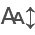

In [2]:
import pandas as pd
import geopandas as gpd
import folium
from shapely.geometry import Point
import numpy as np
from itables import init_notebook_mode, show

# Read the data file
gdf_library = gpd.read_file('../data/Calgary_Public_Library_Locations_and_Hours_20240620.csv')

init_notebook_mode(all_interactive=False)
with pd.option_context("display.float_format", "{:,.4f}".format):
     show(gdf_library[['Library', 'Location']], classes="display nowrap compact",
          buttons = buttons, lengthMenu=[10, 20])
     
# Function to create Point objects from coordinates
def create_point(loc):
    lon, lat = map(float, loc.strip('()').split(', '))
    return Point(lon, lat)

# Convert the 'Location' column to Point objects with correct coordinates
gdf_library['geometry'] = gdf_library['Location'].apply(create_point)

# Ensure gdf_library is a GeoDataFrame
gdf_library = gpd.GeoDataFrame(gdf_library, geometry='geometry')

# Extract coordinates into NumPy array
coords = np.array([(point.x, point.y) for point in gdf_library['geometry']])

# Calculate the median of all points
median_coords = np.median(coords, axis=0)

# Get the median coordinates
median_lat, median_lon = median_coords

# Create a map centered around the median point
m = folium.Map(location=[median_lat, median_lon], zoom_start=10, tiles="cartodbpositron",
               control_scale=True)
# Add markers to the map
icon_size = (8, 8)  # Define the icon size (width, height)

for _, row in gdf_library.iterrows():
    # folium.Marker(
    #     location=[row['geometry'].x, row['geometry'].y],
    #     popup=row['Library'],
    #     icon=folium.CustomIcon(
    #         icon_image='../data/simple_icon_red.png',  # Replace with the path to your icon image
    #         icon_size=icon_size,
    #         icon_anchor=(0, 0),  # Adjust anchor to the center of the icon
    #         popup_anchor=(0, 0)  # Adjust popup anchor to appear above the icon
    #     )
    # ).add_to(m)
    folium.CircleMarker(
        location=[row['geometry'].x, row['geometry'].y],
        popup=row['Library'],
        radius=4,
        stroke=False,
        fill_opacity=1,
        color='red',
        fill=True,
        fill_color='red'
    ).add_to(m)

# Calculate the bounds of all geometries
bounds = gdf_library.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of all geometries
m.fit_bounds([[bounds[0], bounds[1]], [bounds[2], bounds[3]]])

# Create a legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 150px; height: 50px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;">
 <b>Legend</b><br>
 <svg height="20" width="20">
  <circle cx="10" cy="10" r="4" fill="red" />
</svg> Calgary Library<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# m.save('vector_figures/calgary_libraries_map.html')
display(m)


In this map, each point represents a Calgary library location. For instance, the Nose Hill Library is located at coordinates 51.0960922, -114.1391296.

`````{admonition} Note - Map Scale
:class: warning

In GIS, scale refers to the ratio of distance on the map to actual distance on the ground. A large-scale map shows a smaller area with more detail, while a small-scale map covers a larger area with less detail.

On Folium maps, the scale is typically shown in both kilometers and miles (e.g., 5 km or 5 mi) for easy distance estimation.
`````

````{prf:example}
:label: example3.2.2

The [Transit LRT Stations Map dataset](https://data.calgary.ca/Transportation-Transit/Transit-LRT-Stations-Map/c6ee-wk9g) uses points to represent the locations of Calgary Light Rail Transit (LRT) stations on a map.

````


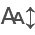

In [3]:
import pandas as pd
import geopandas as gpd
import folium
from shapely.geometry import Point
import numpy as np
from itables import init_notebook_mode, show
import branca

# Read the new data file
gdf_station = gpd.read_file('../data/Transit_LRT_Stations_20240901.csv')

init_notebook_mode(all_interactive=False)
with pd.option_context("display.float_format", "{:,.4f}".format):
     show(gdf_station[['STATIONNAM', 'DIRECTION', 'the_geom']], classes="display nowrap compact",
          buttons = buttons, lengthMenu=[10, 20])
     
# Function to create Point objects from coordinates
def create_point(geom):
    lon, lat = map(float, geom.strip('POINT ()').split())
    return Point(lon, lat)

# Convert the 'the_geom' column to Point objects with correct coordinates
gdf_station['geometry'] = gdf_station['the_geom'].apply(create_point)

# Ensure gdf_station is a GeoDataFrame
gdf_station = gpd.GeoDataFrame(gdf_station, geometry='geometry')

# Extract coordinates into NumPy array
coords = np.array([(point.x, point.y) for point in gdf_station['geometry']])

# Calculate the median of all points
median_coords = np.median(coords, axis=0)

# Get the median coordinates
median_lat, median_lon = median_coords

# Create a map centered around the median point
m = folium.Map(location=[median_lat, median_lon], zoom_start=10, tiles="cartodbpositron",
               control_scale=True)

# Add markers to the map
icon_size = (8, 8)  # Define the icon size (width, height)

for _, row in gdf_station.iterrows():
    if 'West' in row['DIRECTION'] or 'East' in row['DIRECTION']:
        color='red'
    else:
        color='blue'
    
    folium.CircleMarker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=row['STATIONNAM'],
        radius=4,
        stroke=False,
        fill_opacity=1,
        color = color,
        fill=True,
        fill_color = color
        ).add_to(m)

# Calculate the bounds of all geometries
bounds = gdf_station.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of all geometries
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Create a legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 220px; height: 70px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;">
 <b>Legend</b><br>
 <svg height="20" width="20">
  <circle cx="10" cy="10" r="4" fill="blue" />
</svg> West/East Direction<br>
 <svg height="20" width="20">
  <circle cx="10" cy="10" r="4" fill="red" />
</svg> North/South Direction<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

display(m)


## Lines

Lines, or polylines, are sequences of connected points that represent linear features.

- **Uses**: Map rivers, roads, utility lines, or any path-like features.
- **Attributes**: Can include information like length, name, or type of feature.


````{prf:example}
:label: example3.2.3

The following map displays the [LRT tracks](https://data.calgary.ca/Transportation-Transit/Tracks-LRT/873d-3sim) for the city of Calgary, illustrating the light rail transit system's routes.

````

In [4]:
# figure: lrt map
import geopandas as gpd
import folium
import pandas as pd
from shapely import wkt

# Read the CSV file into a DataFrame
df_lrt = pd.read_csv('../data/Tracks_-_LRT_20240622.csv')

# Convert the 'the_geom' column to LineString geometries
df_lrt['geometry'] = df_lrt['the_geom'].apply(wkt.loads)

# Filter the DataFrame to include only rows where RAIL_TYPE is 'LRT'
df_lrt = df_lrt[df_lrt['RAIL_TYPE'] == 'LRT']

# Create a GeoDataFrame
gdf_lrt = gpd.GeoDataFrame(df_lrt, geometry='geometry')

# Calculate the centroid of all geometries for the initial map center
avg_lat = gdf_lrt.geometry.centroid.y.mean()
avg_lon = gdf_lrt.geometry.centroid.x.mean()

# Create a folium map centered around the average coordinates
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=10, tiles="cartodbpositron", control_scale=True)

# Add LineString geometries to the map with color based on 'LRT'
for _, row in gdf_lrt.iterrows():
    folium.PolyLine(
        locations=[(coord[1], coord[0]) for coord in row['geometry'].coords],
        color='green',  # Set the color for 'LRT'
        weight=2
    ).add_to(m)

# Calculate the bounds of all geometries
bounds = gdf_lrt.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of all geometries
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Display the map
display(m)

In [5]:
geometry_to_visualize = gdf_lrt.loc[11].geometry
coords = tuple(str(geometry_to_visualize).replace('LINESTRING ', '').replace('(', '').replace(')', '').split(','))
coords = [tuple(map(float, x.strip().split(' '))) for x in coords]
coords = [(round(lon, 3), round(lat, 3)) for lon, lat in coords]
coords


[(-114.076, 50.974),
 (-114.076, 50.974),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973),
 (-114.076, 50.973)]

Let's examine this specific line segment from the LRT map, which provides a clear example of how vector data represents linear features:

This **LineString** is composed of a sequence of connected points, each corresponding to a specific location along the LRT track. The points used to construct this line segment are as follows:

<center>
[(-114.076, 50.974),  
 (-114.076, 50.974),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973),  
 (-114.076, 50.973)]
</center>

**Breakdown:**

1. **Point Sequence**: Each pair of coordinates denotes a specific point along the track. These points are ordered sequentially to form the path of the LRT line.

2. **Line Segments**: The line segments are formed between each pair of consecutive points. These segments connect to create the complete LineString.

3. **Track Representation**: The sequence of points and connecting segments closely approximates the actual LRT track, capturing any curves or turns.

4. **Precision**: The high precision of the coordinates (14 decimal places) indicates that the data likely originates from accurate GPS measurements or detailed surveying, ensuring an accurate representation of the real-world track.

5. **Data Efficiency**: By recording only these key points rather than every point along the track, the vector data model efficiently represents the LRT line while maintaining high accuracy.

6. **Spatial Context**: This segment is part of a broader network. In a comprehensive GIS application, it would connect with other segments to form the entire LRT system.

7. **Potential Attributes**: Although not visible in the coordinate list, this line segment could have associated attributes such as track name, direction of travel, or maintenance information.

This LineString example illustrates how vector data can accurately represent complex linear features like transit lines, enabling precise mapping and analysis in GIS applications.

To visualize this, the points can be shown as red circles, with blue lines connecting each pair of consecutive points.

In [6]:
import geopandas as gpd
import folium
import pandas as pd
from shapely import wkt

# Read the CSV file into a DataFrame
df_lrt = pd.read_csv('../data/Tracks_-_LRT_20240622.csv')

# Convert the 'the_geom' column to LineString geometries
df_lrt['geometry'] = df_lrt['the_geom'].apply(wkt.loads)

# Filter the DataFrame to include only rows where RAIL_TYPE is 'LRT'
df_lrt = df_lrt[df_lrt['RAIL_TYPE'] == 'LRT']

# Create a GeoDataFrame
gdf_lrt = gpd.GeoDataFrame(df_lrt, geometry='geometry')

# Extract the geometry at index 11
geometry_to_visualize = gdf_lrt.loc[11].geometry

# Calculate the bounds of the geometry
bounds = geometry_to_visualize.bounds  # (minx, miny, maxx, maxy)

# Create a folium map centered around the average coordinates
m = folium.Map(location=[(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2], zoom_start=18, tiles="cartodbpositron", control_scale=True)

# Add the extracted geometry to the map
folium.PolyLine(
    locations=[(coord[1], coord[0]) for coord in geometry_to_visualize.coords],
    color='blue',  # Set the color for 'LRT'
    weight=2
).add_to(m)

# Add red dots for each point in the LineString
for coord in geometry_to_visualize.coords:
    folium.CircleMarker(
        location=(coord[1], coord[0]),
        popup= f'({coord[0]:.3f}, {coord[1]:.3f})',
        radius=3,
        color='red',
        fill=True,
        fill_color='red'
    ).add_to(m)

# Fit the map to the bounds of the geometry
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Create a legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 220px; height: 70px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;">
 <b>Legend</b><br>
 <svg height="20" width="20">
  <line x1="0" y1="10" x2="20" y2="10" style="stroke:blue;stroke-width:2" />
</svg> Lines<br>
 <svg height="20" width="20">
  <circle cx="10" cy="10" r="4" fill="red" />
</svg> Points<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
display(m)

## Polygons

Polygons are closed shapes formed by connecting multiple points in a specific order, creating a series of line segments that enclose an area.

- **Structure**: Composed of a sequence of points (vertices) connected by lines (edges), with the last point connecting back to the first to close the shape.
- **Uses**: Represent areas such as lakes, park boundaries, property lots, or administrative regions.
- **Attributes**: Can include data like area, perimeter, population density, or land use type.


````{prf:example}
:label: example3.2.4

The [City of Calgary's boundary dataset](https://data.calgary.ca/Base-Maps/City-Boundary/7t9h-2z9s) represents the city's official limits as a MULTIPOLYGON. This MULTIPOLYGON is defined by a series of connected points that trace the city's border, effectively outlining the entire municipal area.

````

In [7]:
# figure: calgary boundaries
import folium
import geopandas as gpd
from IPython.display import display

# Load the GeoJSON file
gdf = gpd.read_file('../data/City Boundary_20240620.gpkg')

# Get the center of the map using the new union_all() method
x, y = gdf.geometry.union_all().centroid.x, gdf.geometry.union_all().centroid.y

# Create a folium map centered around the centroid of the GeoJSON
m = folium.Map(location=[y, x], zoom_start=9, tiles="cartodbpositron",
               control_scale=True)

# Add the GeoJSON to the map
folium.GeoJson(gdf.geometry).add_to(m)

# Calculate the bounds of the GeoJSON
bounds = gdf.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of the GeoJSON
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Display the map
display(m)

`````{admonition} Remark - Multipolygon
:class: important

A multipolygon is a type of geometric shape that consists of multiple polygons, each of which is a closed shape formed by connecting a series of points with line segments.
`````


In the following map, we are exploring the concept of a multipolygon and demonstrating how it is formed. This structure allows for the representation of complex areas that may contain multiple disjoint regions or holes within a single entity. The figure illustrates this by overlaying red points at each vertex of the polygons, which are then connected by blue line segments to form the boundaries of the closed areas. This visual representation helps to understand how the multipolygon encompasses the entire area of interest, highlighting its boundaries and the interconnected nature of its constituent polygons.

In [8]:
# figure: calgary boundaries with points and line segments
import folium
import geopandas as gpd
from IPython.display import display
from shapely.geometry import MultiPolygon, Polygon

# Load the GeoJSON file
gdf = gpd.read_file('../data/City Boundary_20240620.gpkg')

# Get the center of the map using the new union_all() method
x, y = gdf.geometry.union_all().centroid.x, gdf.geometry.union_all().centroid.y

# Create a folium map centered around the centroid of the GeoJSON
m = folium.Map(location=[y, x], zoom_start=9, tiles="cartodbpositron",
               control_scale=True)

# Add the GeoJSON to the map
folium.GeoJson(gdf.geometry).add_to(m)

# Extract points from the multipolygon
line_coords = []

def add_polygon_points(polygon):
    coords = list(polygon.exterior.coords)
    for point in coords:
        folium.CircleMarker(
            location=[point[1], point[0]],
            radius=3,
            color='red',
            fill=True,
            fillColor='red'
        ).add_to(m)
        line_coords.append([point[1], point[0]])

for geom in gdf.geometry:
    if isinstance(geom, MultiPolygon):
        for polygon in geom.geoms:
            add_polygon_points(polygon)
    elif isinstance(geom, Polygon):
        add_polygon_points(geom)

# Add line segments connecting the points
folium.PolyLine(locations=line_coords, color="blue", weight=2, opacity=0.8).add_to(m)

# Calculate the bounds of the GeoJSON
bounds = gdf.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of the GeoJSON
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Display the map
display(m)

## Attribute Tables

In Geographic Information Systems (GIS), attribute tables are crucial for managing and analyzing spatial data. These tables store **non-spatial data** that is directly linked to spatial features on a map. Each spatial feature, such as a building, road, or land parcel, is associated with a record in the attribute table. This connection is established through a unique numerical identifier known as a Feature Identifier (FID). For instance, a park represented as a spatial feature on a GIS map might have an FID of 102. Its corresponding record in the attribute table could include attributes like area, vegetation type, and usage regulations. This linkage allows users to perform detailed queries and analyses based on both spatial and non-spatial data.

````{prf:example}
:label: example3.2.5

Consider the attribute tables for the [Calgary Community Boundaries dataset](https://data.calgary.ca/Base-Maps/Community-Boundaries/ab7m-fwn6). This example provides a glimpse into how each spatial feature, such as a park or residential area, is represented in the table with a unique Feature Identifier (FID). The table includes various attributes such as class, class code, community code, name, sector, and more, which describe the non-spatial characteristics of the spatial features. By integrating spatial data (like MULTIPOLYGON geometries) with descriptive information, GIS enables detailed analysis and informed decision-making. This example underscores the importance of attribute tables in effectively managing and utilizing geospatial data.

````


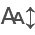

In [9]:
# table and figure
import geopandas as gpd
import pandas as pd
import folium
from shapely import wkt
from shapely.geometry import MultiPolygon
from itables import init_notebook_mode, show
init_notebook_mode(all_interactive=False)

# Read the data file
gdf = gpd.read_file('../data/Community_District_Boundaries_20240620.csv')

# display(gdf)
with pd.option_context("display.float_format", "{:,.4f}".format):
     show(gdf, classes="display nowrap compact",
          buttons = buttons, lengthMenu=[10, 20])
     
# Ensure the coordinate reference system is set to 'epsg:4326'
gdf.crs = 'epsg:4326'

# Convert 'MULTIPOLYGON' column to geometry
gdf['geometry'] = gdf['MULTIPOLYGON'].apply(wkt.loads)  

# Figure
# Recreate the GeoDataFrame with the new geometry column
gdf = gpd.GeoDataFrame(gdf, geometry='geometry', crs='epsg:4326')

# Define a color map for different classes
color_map = {
    'Residential': 'red',
    'Industrial': 'blue',
    'Major Park': 'green',
    'Residual Sub Area': 'purple',
    # Add more classes and colors as needed
}

center_loc = [gdf.to_crs(epsg=32611).geometry.centroid.y.mean(), gdf.to_crs(epsg=32611).geometry.centroid.x.mean()]

# Initialize the folium map centered around the mean coordinates of the geometries
m = folium.Map(location = center_loc,
               zoom_start=9, tiles="cartodbpositron", control_scale=True)

# Add each geometry to the map with a different color based on its class
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, color=color_map.get(row['CLASS'], 'black'): {
            'fillColor': color,
            'color': color,
            'weight': 2,
            'fillOpacity': 0.6
        }
    ).add_to(m)

# Calculate the bounds of the GeoJSON
bounds = gdf.total_bounds  # (minx, miny, maxx, maxy)

# Fit the map to the bounds of the GeoJSON
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Create a legend HTML
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 150px; height: 110px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     ">
     &nbsp;<b> Legend </b><br>
     &nbsp;<i class="fa fa-square" style="color:red"></i>&nbsp; Residential <br>
     &nbsp;<i class="fa fa-square" style="color:blue"></i>&nbsp; Industrial <br>
     &nbsp;<i class="fa fa-square" style="color:green"></i>&nbsp; Major Park <br>
     &nbsp;<i class="fa fa-square" style="color:purple"></i>&nbsp; Residual Sub Area <br>
     <!-- Add more classes here if needed -->
</div>
'''

# Add the legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

display(m)

## Applications of Vector Data

Vector data is crucial in applications requiring high precision and detail:

1. **Cadastral Mapping**: 
   - Creates maps showing property boundaries and land ownership.
   - Requires high precision due to legal implications.

2. **Navigation Systems**: 
   - GPS and other navigation tools use vector data for accurate turn-by-turn directions and route planning.

3. **Urban Planning**: 
   - Helps in zoning, infrastructure development, and land use analysis.

4. **Environmental Management**: 
   - Used for tracking wildlife habitats, monitoring deforestation, or managing protected areas.

5. **Network Analysis**: 
   - Crucial for analyzing transportation networks, utility grids, or communication systems.

Vector data's ability to represent discrete features with clear boundaries and maintain accuracy at different scales makes it an essential component in GIS and spatial analysis. Its efficiency in storing and processing geographical information enables complex spatial queries and analyses, supporting a wide range of applications across various fields.

## Advantages and Disadvantages of Vector Data

Vector data models are fundamental in Geographic Information Systems (GIS) for representing discrete spatial features. These models use points, lines, and polygons to depict real-world objects and their relationships. While vector data offers numerous benefits, it also presents certain challenges in specific applications {cite}`atlas_raster_2024, gisgeography_vector_2015`.

### Advantages of Vector Data

1. **Precision and Accuracy**: 
   - Vector data excels in representing boundaries and features with high geometric accuracy {cite}`shekhar2014vector`.
   - It's ideal for precise mapping of discrete objects such as property lines, roads, or point locations {cite}`longley2015geographic`.
   - The accuracy is maintained regardless of scale, which is crucial for detailed spatial analysis and decision-making processes {cite}`bolstad2019gis`.

2. **Scalability**: 
   - Vector graphics can be scaled up or down infinitely without loss of quality or detail {cite}`longley2015geographic`.
   - This enables seamless zooming in maps and GIS applications without the pixelation seen in raster images {cite}`kraak2020cartography`.
   - The scalability is particularly valuable in web mapping and multi-scale cartography, where users need to view data at various levels of detail {cite}`bolstad2019gis`.

3. **Efficient Storage**: 
   - Vector data generally requires less storage space compared to raster data, especially for sparse datasets {cite}`shekhar2014vector`.
   - It's highly efficient for representing linear features (e.g., roads, rivers) and discrete point data {cite}`longley2015geographic`.
   - Vector format reduces data redundancy in areas with homogeneous attributes, optimizing storage and processing {cite}`bolstad2019gis`.

4. **Topological Relationships**: 
   - Vector data preserves spatial relationships between features, such as adjacency and connectivity {cite}`shekhar2014vector`.
   - This facilitates complex network analysis, including routing or flow modeling in transportation networks {cite}`longley2015geographic`.
   - It enables sophisticated spatial queries and analyses based on feature relationships, enhancing the depth of spatial understanding {cite}`bolstad2019gis`.

5. **Complex Analysis Capabilities**: 
   - Vector data supports advanced spatial operations like overlay analysis, buffering, and intersection {cite}`longley2015geographic`.
   - It allows for detailed attribute information to be associated with each feature, enabling rich, multi-dimensional analysis {cite}`shekhar2014vector`.
   - This makes it ideal for applications requiring precise measurements and calculations in fields like urban planning or environmental management {cite}`bolstad2019gis`.

### Disadvantages of Vector Data

1. **Complex Data Structure**: 
   - The relationships between points, lines, and polygons can be intricate to manage and maintain {cite}`shekhar2014vector`.
   - Processing and analysis often require more complex algorithms compared to raster data {cite}`longley2015geographic`.
   - Editing or updating large vector datasets can be challenging and time-consuming {cite}`bolstad2019gis`.

2. **Computational Intensity**: 
   - Certain spatial operations, such as network analysis or topology validation, can be computationally demanding {cite}`longley2015geographic`.
   - Large datasets or complex analyses may require significant processing power, potentially slowing down operations {cite}`bolstad2019gis`.
   - This can lead to performance issues in real-time applications that handle extensive vector data {cite}`kraak2020cartography`.

3. **Limited Representation of Continuous Phenomena**: 
   - Vector data is less suitable for representing gradual changes across a landscape, such as elevation or temperature gradients {cite}`shekhar2014vector`.
   - Modeling continuous surfaces often requires interpolation or additional processing, which can introduce inaccuracies {cite}`longley2015geographic`.

4. **Data Acquisition Complexity**: 
   - Collecting vector data frequently demands more time and resources compared to raster data collection methods {cite}`bolstad2019gis`.
   - High precision in data collection is crucial to maintain the advantages of vector representation, which can increase costs and complexity {cite}`longley2015geographic`.

5. **Visualization Challenges**: 
   - Rendering complex vector datasets can be computationally intensive, especially for web-based applications with limited resources {cite}`kraak2020cartography`.
   - Effective display at smaller scales may require generalization or simplification of the data, which can be a complex process {cite}`bolstad2019gis`.

<!-- ## Selecting Appropriate GIS Data Types

When working with GIS software like ArcGIS, choosing the right data type is crucial for efficient data storage and analysis. The data types available are designed to accommodate various forms of data, from numerical values to text. Below is a refined table that outlines the key data types along with their storage capabilities and optimal usage scenarios:

| Data Type | Value Range | Storage Size | Ideal Use |
|---------------|-----------------|------------------|---------------|
| **Short Integer** | -32,768 to 32,767 | 2 bytes | Small whole numbers |
| **Long Integer** | -2,147,483,648 to 2,147,483,647 | 4 bytes | Large whole numbers |
| **Float** | $-3.4 \times 10^{-38}$ to $1.2 \times 10^{38}$ | 4 bytes | Approximate real numbers with up to 6 digits precision |
| **Double** | $-2.2 \times 10^{-308}$ to $1.8 \times 10^{308}$ | 8 bytes | Precise real numbers with up to 15 digits precision |
| **Text** | Up to 65,535 characters | Variable | Alphanumeric data including letters and words |

**Key Considerations:**
- **Efficiency**: Use integers for whole numbers to conserve storage and enhance performance.
- **Precision**: Choose floats or doubles based on the required precision and range of your real numbers.
- **Text and Unicode**: Utilize text fields for alphanumeric data, with Unicode encoding to support international character sets.

The selection of data types directly affects how data is managed and analyzed within your GIS application. -->